# **Federated Autoencoder**

### **i. Imports and subfunctions**

In [1]:
# Imports
import copy
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from torch.utils.data import Subset, DataLoader, random_split
from torch import nn
from torchvision import transforms, datasets

# Subfunctions
def split_iid(dataset, n_centers):
    """ Split PyTorch dataset randomly into n_centers."""
    n_obs_per_center = [len(dataset) // n_centers for _ in range(n_centers)]
    return random_split(dataset, n_obs_per_center)

def get_data(subset, batch_size=False, shuffle=True):
    """ Extracts data from a Subset torch dataset in the form of a tensor."""
    if not batch_size:
        batch_size = len(subset)
    loader = DataLoader(subset, batch_size=batch_size, shuffle=shuffle, num_workers=4)
    return iter(loader).next()

def federated_averaging(models, n_obs_per_client):
    """ Perform federated averaging."""
    # Error check inputs
    assert len(models) > 0
    assert len(n_obs_per_client) == len(models)

    # Compute proportions
    n_obs = sum(n_obs_per_client)
    proportions = [n_k / n_obs for n_k in n_obs_per_client]

    # Empty model parameter dictionary
    avg_params = models[0].state_dict()
    for key, val in avg_params.items():
        avg_params[key] = torch.zeros_like(val)

    # Compute average
    for model, proportion in zip(models, proportions):
        for key in avg_params.keys():
            avg_params[key] += proportion * model.state_dict()[key]

    # Copy one of the models and load trained params
    avg_model = copy.deepcopy(models[0])
    avg_model.load_state_dict(avg_params)

    return avg_model

### **ii. General setup**

In [2]:
# GPU settings
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load data
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0,), (1,))])
dataset = datasets.MNIST('~/data/', train=True, download=True, transform=transform)
train_dataset = datasets.MNIST(root="~/torch_datasets", train=True, transform=transform, download=True)
test_dataset = datasets.MNIST(root="~/torch_datasets", train=False, transform=transform, download=True)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=4, pin_memory=True)

# Federate data
N_ROUNDS = 10
N_CENTRES = 4
N_EPOCHS = 15
federated_dataset = split_iid(train_dataset, n_centers=4)
print('Number of centers:', len(federated_dataset))

# Put data into dataloader
for i, dataset in enumerate(federated_dataset):
    federated_dataset[i] = torch.utils.data.DataLoader(dataset, batch_size=128, shuffle=True, num_workers=4, pin_memory=True)

Using downloaded and verified file: /Users/hd119/data/MNIST/raw/train-images-idx3-ubyte.gz
Extracting /Users/hd119/data/MNIST/raw/train-images-idx3-ubyte.gz to /Users/hd119/data/MNIST/raw

Using downloaded and verified file: /Users/hd119/data/MNIST/raw/train-labels-idx1-ubyte.gz
Extracting /Users/hd119/data/MNIST/raw/train-labels-idx1-ubyte.gz to /Users/hd119/data/MNIST/raw

Using downloaded and verified file: /Users/hd119/data/MNIST/raw/t10k-images-idx3-ubyte.gz
Extracting /Users/hd119/data/MNIST/raw/t10k-images-idx3-ubyte.gz to /Users/hd119/data/MNIST/raw

Using downloaded and verified file: /Users/hd119/data/MNIST/raw/t10k-labels-idx1-ubyte.gz
Extracting /Users/hd119/data/MNIST/raw/t10k-labels-idx1-ubyte.gz to /Users/hd119/data/MNIST/raw

Processing...
Done!
Using downloaded and verified file: /Users/hd119/torch_datasets/MNIST/raw/train-images-idx3-ubyte.gz
Extracting /Users/hd119/torch_datasets/MNIST/raw/train-images-idx3-ubyte.gz to /Users/hd119/torch_datasets/MNIST/raw


/Users/hd119/miniconda3/envs/pytorch/lib/python3.9/site-packages/torchvision/datasets/mnist.py:502: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_69nk78ncaj/croot/pytorch_1669252638507/work/torch/csrc/utils/tensor_numpy.cpp:178.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)



Using downloaded and verified file: /Users/hd119/torch_datasets/MNIST/raw/train-labels-idx1-ubyte.gz
Extracting /Users/hd119/torch_datasets/MNIST/raw/train-labels-idx1-ubyte.gz to /Users/hd119/torch_datasets/MNIST/raw

Using downloaded and verified file: /Users/hd119/torch_datasets/MNIST/raw/t10k-images-idx3-ubyte.gz
Extracting /Users/hd119/torch_datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to /Users/hd119/torch_datasets/MNIST/raw

Using downloaded and verified file: /Users/hd119/torch_datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz
Extracting /Users/hd119/torch_datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to /Users/hd119/torch_datasets/MNIST/raw

Processing...
Done!
Number of centers: 4


### **1. Create model**

In [5]:
# Autoencoder class
class AutoEncoder(nn.Module):
    def __init__(self, **kwargs):
        super().__init__()
        self.encoder_hidden_layer = nn.Linear(
            in_features=kwargs["input_shape"], out_features=128
        )
        self.encoder_output_layer = nn.Linear(
            in_features=128, out_features=128
        )
        self.decoder_hidden_layer = nn.Linear(
            in_features=128, out_features=128
        )
        self.decoder_output_layer = nn.Linear(
            in_features=128, out_features=kwargs["input_shape"]
        )

    def forward(self, features):
        activation = self.encoder_hidden_layer(features)
        activation = torch.relu(activation)
        code = self.encoder_output_layer(activation)
        code = torch.relu(code)
        activation = self.decoder_hidden_layer(code)
        activation = torch.relu(activation)
        activation = self.decoder_output_layer(activation)
        reconstructed = torch.relu(activation)
        return reconstructed
    
# Define model paramters and architecture
MyEncoder = AutoEncoder(input_shape=784).to(device)
optimizer = torch.optim.Adam(MyEncoder.parameters(), lr=1e-3)
criterion = nn.MSELoss()

# Copy models over centres
encoders = [copy.deepcopy(MyEncoder) for _ in range(N_CENTRES)]
n_obs_per_client = [len(client_data) for client_data in federated_dataset]

### **2. Train model**

In [6]:
# Initial model parameters
init_params=  MyEncoder.state_dict()

# Loop over training rounds and modelsa and initialise
for _round in range(N_ROUNDS):
    for i, (client_dataset, client_model) in enumerate(zip(federated_dataset, encoders)):
        loss = 0

        # Loop over epochs and batches and train!
        for epoch in range(N_EPOCHS):
            for batch_features, _ in train_load er:
                # Reshape mini-batch data to [N, 784] matrix
                batch_features = batch_features.view(-1, 784).to(device)

                # Reset the gradients back to zero
                optimizer.zero_grad()

                # Compute reconstructions
                outputs = client_model(batch_features)
                
                # Compute training reconstruction loss
                train_loss = criterion(outputs, batch_features)
                
                # Compute accumulated gradients
                train_loss.backward()
                
                # Perform parameter update based on current gradients
                optimizer.step()
                
                # Add the mini-batch training loss to epoch loss
                loss += train_loss.item()

                # Display the epoch training loss
                print(f"Round: {_round}/{N_ROUNDS}, Client: {i+1}, Epoch : {epoch+1}/{N_EPOCHS}, Loss = {loss:.6f}")
        
    # Aggregate models using federated averaging
    trained_model = federated_averaging(encoders, n_obs_per_client)
    init_params = trained_model.state_dict()
        
    # display the epoch training loss
    print("epoch : {}/{}, loss = {:.6f}".format(epoch + 1, N_EPOCHS, loss))

Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.112517
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.223612
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.335660
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.445488
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.554531
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.658666
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.770613
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.882354
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 0.995812
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.110430
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.212864
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.320818
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.429193
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.539379
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.655345
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.760060
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.865910
Round: 0/10, Client: 1, Epoch : 1/15, Loss = 1.971873
Round: 0/10, Client: 1, Epoc

### **3. Plot reconstructions**

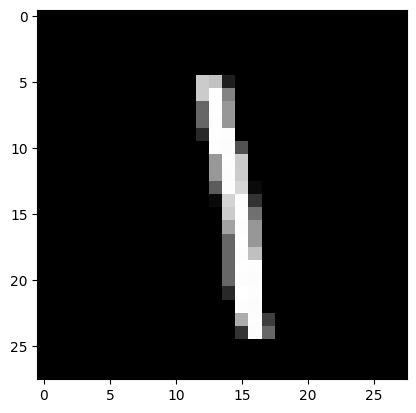

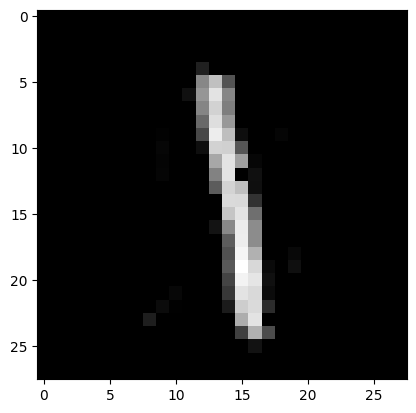

In [5]:
# Loop over test batch
for batch_test_features, _ in test_loader:
    test = batch_test_features.view(-1, 28, 28)
    test_1 = test[-1,:].numpy()    
    test_1_in = batch_test_features.view(-1, 784)[-1,:].to(device=device)
    plt.imshow(test_1, cmap='gray')
    plt.show()
    test_1_recon = MyEncoder.forward(test_1_in)
    test_1_recon = test_1_recon.view(28,28)
    test_1_recon = test_1_recon.cpu().detach().numpy()
    plt.imshow(test_1_recon, cmap='gray')
    plt.show()
    break


In [ ]:
# VAE models
model = Mcvae(data=dummy_data, lat_dim=lat_dim, vaeclass=vae_class)
model.optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-3)
model.init_loss()
# model = model.to(device=device)
models = [copy.deepcopy(model) for _ in range(N_CENTERS)]
n_obs_per_client = [len(client_data) for client_data in federated_dataset]

In [ ]:
# Initialise paramters
init_params = model.state_dict()

# Loop over training rounds and clients
for round_i in range(N_ROUNDS):
    for client_dataset, client_model in zip(federated_dataset, models):
        # Load client data in the form of a tensor
        X, y = get_data(client_dataset)
        # X = X.to(device=device)
        # y = y.to(device=device)
        client_model.data = [X.view(-1, N_FEATURES)]  # Set data attribute in client's model (list wraps the number of channels)

        # Load client's model parameters and train
        client_model.load_state_dict(init_params)
        client_model.optimize(epochs=N_EPOCHS, data=client_model.data)
        
    # Aggregate models using federated averaging
    trained_model = federated_averaging(models, n_obs_per_client)
    init_params = trained_model.state_dict()

### **3. Visualise results**